In [1]:
import pandas as pd
import numpy as np
import inflection
import folium
from folium.plugins import MarkerCluster
import plotly.express as px

# Reading Dataset

In [2]:
data_path = f"../data/zomato.csv"
df_original = pd.read_csv(data_path)
df = df_original.copy()

In [3]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6310675,Mama Lou's Italian Kitchen,162,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,Italian,...,Botswana Pula(P),1,0,0,0,3,4.6,3F7E00,Excellent,619
1,6310675,Mama Lou's Italian Kitchen,162,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,Italian,...,Botswana Pula(P),1,0,0,0,3,4.6,3F7E00,Excellent,619
2,6314542,Blackbird,162,Makati City,"Nielson Tower, Ayala Triangle Gardens, Salcedo...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.024562,14.556042,"European, Asian",...,Botswana Pula(P),0,0,0,0,4,4.7,3F7E00,Excellent,469
3,6301293,Banapple,162,Makati City,"Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.023171,14.556196,"Filipino, American, Italian, Bakery",...,Botswana Pula(P),0,0,0,0,3,4.4,5BA829,Very Good,867
4,6315689,Bad Bird,162,Makati City,"Hole In The Wall, Floor 4, Century City Mall, ...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027708,14.565899,American,...,Botswana Pula(P),0,0,0,0,3,4.4,5BA829,Very Good,858


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7527 entries, 0 to 7526
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         7527 non-null   int64  
 1   Restaurant Name       7527 non-null   object 
 2   Country Code          7527 non-null   int64  
 3   City                  7527 non-null   object 
 4   Address               7527 non-null   object 
 5   Locality              7527 non-null   object 
 6   Locality Verbose      7527 non-null   object 
 7   Longitude             7527 non-null   float64
 8   Latitude              7527 non-null   float64
 9   Cuisines              7512 non-null   object 
 10  Average Cost for two  7527 non-null   int64  
 11  Currency              7527 non-null   object 
 12  Has Table booking     7527 non-null   int64  
 13  Has Online delivery   7527 non-null   int64  
 14  Is delivering now     7527 non-null   int64  
 15  Switch to order menu 

In [5]:
df['Switch to order menu'].unique()

array([0], dtype=int64)

#### OBSERVAÇÕES
- A coluna cuisine possui valores nulos
- Os valores não possuem espaçamentos
- Colunas binárias estão como inteiras
- A coluna Switch to order menu possui apenas um valor

# Data Preparation

In [6]:
# Countries' name
COUNTRIES = {
1: "India",
14: "Australia",
30: "Brazil",
37: "Canada",
94: "Indonesia",
148: "New Zealand",
162: "Philippines",
166: "Qatar",
184: "Singapore",
189: "South Africa",
191: "Sri Lanka",
208: "Turkey",
214: "United Arab Emirates",
215: "England",
216: "United States of America"
}

def country_name(country_id):
    return COUNTRIES[country_id]

df["Country Name"] = df["Country Code"].apply(country_name)

In [7]:
# Category for price range
def create_price_tye(price_range):
    if price_range == 1:
        return "cheap"
    elif price_range == 2:
        return "normal"
    elif price_range == 3:
        return "expensive"
    else:
        return "gourmet"
    
df['Price Tye'] = df['Price range'].apply(create_price_tye)

In [8]:
# Colors' name
COLORS = {
"3F7E00": "darkgreen",
"5BA829": "green",
"9ACD32": "lightgreen",
"CDD614": "orange",
"FFBA00": "red",
"CBCBC8": "darkred",
"FF7800": "darkred",
}

def color_name(color_code):
    return COLORS[color_code]

df['Color Name'] = df['Rating color'].apply(color_name)

In [9]:
# Rename the column names to have a pattern
def rename_columns(dataframe):
    df = dataframe.copy()
    # capitalize all first letters
    title = lambda x: inflection.titleize(x)
    # put all letters in lowercase and join them with undercore
    snakecase = lambda x: inflection.underscore(x)
    # remove space in string
    spaces = lambda x: x.replace(" ", "")
    cols_old = list(df.columns)
    # the map function applies a function, in this case the title function, to each element in cols_old
    cols_old = list(map(title, cols_old))
    cols_old = list(map(spaces, cols_old))
    cols_new = list(map(snakecase, cols_old))
    df.columns = cols_new
    return df

df = rename_columns(df)

In [10]:
# Drop nan values
df.dropna(inplace = True)
#df['cuisines'].isna().sum()

# Get only the first type of cuisine
df["cuisines"] = df.loc[:, "cuisines"].apply(lambda x: x.split(",")[0])

In [11]:
# Dicionário de taxas de câmbio em relação ao Real (BRL)
taxas_cambio = {
    'Botswana Pula(P)': 0.40,       # 1 BWP = 0.40 BRL
    'Brazilian Real(R$)': 1.0,      # 1 BRL = 1 BRL
    'Dollar($)': 5.43,              # 1 USD = 5.43 BRL
    'Emirati Diram(AED)': 1.48,     # 1 AED = 1.48 BRL
    'Indian Rupees(Rs.)': 0.065,    # 1 INR = 0.0065 BRL
    'Indonesian Rupiah(IDR)': 0.00034, # 1 IDR = 0.00034 BRL
    'NewZealand($)': 3.33,          # 1 NZD = 3.33 BRL
    'Pounds(£)': 6.90,               # 1 GBP = 6.90 BRL
    'Qatari Rial(QR)': 1.49,        # 1 QAR = 1.49 BRL
    'Rand(R)': 0.30,                # 1 ZAR = 0.30 BRL
    'Sri Lankan Rupee(LKR)': 0.018, # 1 LKR = 0.018 BRL
    'Turkish Lira(TL)': 0.16        # 1 TRY = 0.16 BRL
}

def converter_para_brl(cambio):
    moeda = cambio['currency']
    taxa = taxas_cambio.get(moeda, 1)  # Pega a taxa de câmbio, ou 1 se não encontrar
    return cambio['average_cost_for_two'] * taxa


# Aplicar a conversão para BRL
df['average_cost_for_two_brl'] = df.apply(converter_para_brl, axis=1)

In [12]:
df.drop_duplicates(inplace = True)
df = df.reset_index().drop(columns = 'index')

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6929 entries, 0 to 6928
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   restaurant_id             6929 non-null   int64  
 1   restaurant_name           6929 non-null   object 
 2   country_code              6929 non-null   int64  
 3   city                      6929 non-null   object 
 4   address                   6929 non-null   object 
 5   locality                  6929 non-null   object 
 6   locality_verbose          6929 non-null   object 
 7   longitude                 6929 non-null   float64
 8   latitude                  6929 non-null   float64
 9   cuisines                  6929 non-null   object 
 10  average_cost_for_two      6929 non-null   int64  
 11  currency                  6929 non-null   object 
 12  has_table_booking         6929 non-null   int64  
 13  has_online_delivery       6929 non-null   int64  
 14  is_deliv

# Desafio

## Geral

In [14]:
# Quantos restaurantes únicos estão registrados?
df['restaurant_id'].nunique()

6929

In [15]:
# Quantos países únicos estão registrados?
df['country_name'].nunique()

15

In [16]:
# Quantas cidades únicas estão registradas?
df['city'].nunique()

125

In [17]:
# Qual o total de avaliações feitas?
df['votes'].sum()

4194533

In [18]:
# Qual o total de tipos de culinária registrados?
df['cuisines'].nunique()

165

## País

In [19]:
# Qual o nome do país que possui mais cidades registradas?
cols = ['country_name', 'city']
df_aux = df.loc[:, cols].groupby('country_name').nunique().sort_values('city', ascending = False).reset_index()
max_linha = df_aux['city'].idxmax()
max_city = df_aux.loc[max_linha, ['country_name', 'city']]
max_city

country_name    India
city               49
Name: 0, dtype: object

In [20]:
# Qual o nome do país que possui mais restaurantes registrados?
cols = ['country_name', 'restaurant_id']
df_aux = df.loc[:, cols].groupby('country_name').nunique().sort_values('restaurant_id', ascending = False).reset_index()
max_linha = df_aux['restaurant_id'].idxmax()
max_rest = df_aux.loc[max_linha, ['country_name', 'restaurant_id']]
max_rest

country_name     India
restaurant_id     3111
Name: 0, dtype: object

In [21]:
# Qual o nome do país que possui mais restaurantes com o nível de preço igual a 4 registrados?
cols = ['country_name', 'price_range']
linhas = df['price_range'] == 4
df_aux = df.loc[linhas, cols].groupby('country_name').count().sort_values('price_range', ascending = False).reset_index()
max_linha = df_aux['price_range'].idxmax()
max_price = df_aux.loc[max_linha, ['country_name', 'price_range']]
max_price

country_name    United States of America
price_range                          415
Name: 0, dtype: object

In [22]:
# Qual o nome do país que possui a maior quantidade de tipos de culinária distintos?
colunm = 'cuisines'
cols = ['country_name', colunm]
df_aux = df.loc[:, cols].groupby('country_name').nunique().sort_values(colunm, ascending = False).reset_index()
max_linha = df_aux[colunm].idxmax()
max_cuisine = df_aux.loc[max_linha, ['country_name', colunm]]
max_cuisine

country_name    India
cuisines           77
Name: 0, dtype: object

In [23]:
# Qual o nome do país que possui a maior quantidade de avaliações feitas?
colunm = 'votes'
cols = ['country_name', colunm]
df_aux = df.loc[:, cols].groupby('country_name').sum().sort_values(colunm, ascending = False).reset_index()
max_linha = df_aux[colunm].idxmax()
max_votes = df_aux.loc[max_linha, ['country_name', colunm]]
max_votes

country_name      India
votes           2800164
Name: 0, dtype: object

In [24]:
# Qual o nome do país que possui a maior quantidade de restaurantes que fazem entrega?
colunm = 'is_delivering_now'
cols = ['country_name', colunm]
linhas = df[colunm] == 1
df_aux = df.loc[linhas, cols].groupby('country_name').count().sort_values(colunm, ascending = False).reset_index()
max_linha = df_aux[colunm].idxmax()
max_delivery = df_aux.loc[max_linha, ['country_name', colunm]]
max_delivery

country_name         India
is_delivering_now     1150
Name: 0, dtype: object

In [25]:
# Qual o nome do país que possui a maior quantidade de restaurantes que aceitam reservas?
colunm = 'has_table_booking'
cols = ['country_name', colunm]
linhas = df[colunm] == 1
df_aux = df.loc[linhas, cols].groupby('country_name').count().sort_values(colunm, ascending = False).reset_index()
max_linha = df_aux[colunm].idxmax()
max_booking = df_aux.loc[max_linha, ['country_name', colunm]]
max_booking

country_name         India
has_table_booking      256
Name: 0, dtype: object

In [26]:
# Qual o nome do país que possui, na média, a maior quantidade de avaliações registrada?
colunm = 'aggregate_rating'
cols = ['country_name', colunm]
df_aux = df.loc[:, cols].groupby('country_name').count().sort_values(colunm, ascending = False).reset_index()
max_linha = df_aux[colunm].idxmax()
max_rating = df_aux.loc[max_linha, ['country_name', colunm]]
max_rating

country_name        India
aggregate_rating     3111
Name: 0, dtype: object

In [27]:
# Qual o nome do país que possui, na média, a maior nota média registrada?
colunm = 'aggregate_rating'
cols = ['country_name', colunm]
df_aux = df.loc[:, cols].groupby('country_name').mean().sort_values(colunm, ascending = False).reset_index()
max_linha = df_aux[colunm].idxmax()
max_mean = df_aux.loc[max_linha, ['country_name', colunm]]
max_mean

country_name        Indonesia
aggregate_rating      4.60125
Name: 0, dtype: object

In [28]:
# Qual o nome do país que possui, na média, a menor nota média registrada?
colunm = 'aggregate_rating'
cols = ['country_name', colunm]
df_aux = df.loc[:, cols].groupby('country_name').mean().sort_values(colunm, ascending = False).reset_index()
max_linha = df_aux[colunm].idxmin()
min_mean = df_aux.loc[max_linha, ['country_name', colunm]]
min_mean

country_name          Brazil
aggregate_rating    3.321667
Name: 14, dtype: object

In [29]:
# Qual a média de preço de um prato para dois por país?
colunm = 'average_cost_for_two'
cols = ['country_name', colunm]
df_aux = df.loc[:, cols].groupby('country_name').mean().sort_values(colunm, ascending = False).reset_index()
df_aux

,country_name,average_cost_for_two
0,Indonesia,303000.000000
1,Australia,138959.783333
2,Sri Lanka,2579.375000
3,Philippines,1227.825000
4,India,704.400514
5,South Africa,339.228324
6,Qatar,174.000000
7,United Arab Emirates,153.716667
8,Singapore,141.437500
9,Brazil,138.812500


## Cidade

In [30]:
# Qual o nome da cidade que possui mais restaurantes registrados?
column = 'restaurant_id'
cols = ['city', column]
df_aux = df.loc[:, cols].groupby('city').nunique().sort_values(column, ascending = False).reset_index()
max_linha = df_aux[column].idxmax()
max_rest = df_aux.loc[max_linha, ['city', column]]
max_rest

city             Abu Dhabi
restaurant_id           80
Name: 0, dtype: object

In [31]:
#  Qual o nome da cidade que possui mais restaurantes com nota média acima de 4?
column = 'aggregate_rating'
cols = ['city', column]
linhas = df[column] > 4
df_aux = df.loc[linhas, cols].groupby('city').count().sort_values(column, ascending = False).reset_index()
max_linha = df_aux[column].idxmax()
max_rating = df_aux.loc[max_linha, ['city', column]]
max_rating

city                Bangalore
aggregate_rating           79
Name: 0, dtype: object

In [32]:
# Qual o nome da cidade que possui mais restaurantes com nota média abaixo de 2.5?
column = 'aggregate_rating'
col_groupby = 'city'
cols = [col_groupby, column]
linhas = df[column] < 2.5
df_aux = df.loc[linhas, cols].groupby(col_groupby).count().sort_values(column, ascending = False).reset_index()
max_linha = df_aux[column].idxmax()
min_rating = df_aux.loc[max_linha, [col_groupby, column]]
min_rating

city                Gangtok
aggregate_rating         33
Name: 0, dtype: object

In [33]:
# Qual o nome da cidade que possui o maior valor médio de um prato para dois?
col_groupby = 'city'
colunm = 'has_table_booking'
cols = [col_groupby, colunm]
linhas = df[colunm] == 1
df_aux = df.loc[linhas, cols].groupby(col_groupby).count().sort_values(colunm, ascending = False).reset_index()
max_linha = df_aux[colunm].idxmax()
max_booking = df_aux.loc[max_linha, [col_groupby, colunm]]
max_booking

city                 Bangalore
has_table_booking           42
Name: 0, dtype: object

In [34]:
# Qual o nome da cidade que possui a maior quantidade de tipos de culinária distintas?
col_groupby = 'city'
colunm = 'cuisines'
cols = [col_groupby, colunm]
df_aux = df.loc[:, cols].groupby(col_groupby).nunique().sort_values(colunm, ascending = False).reset_index()
max_linha = df_aux[colunm].idxmax()
max_cuisine = df_aux.loc[max_linha, [col_groupby, colunm]]
max_cuisine

city        Birmingham
cuisines            32
Name: 0, dtype: object

In [35]:
# Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem reservas?
col_groupby = 'city'
colunm = 'has_table_booking'
cols = [col_groupby, colunm]
linhas = df[colunm] == 1
df_aux = df.loc[linhas, cols].groupby(col_groupby).count().sort_values(colunm, ascending = False).reset_index()
max_linha = df_aux[colunm].idxmax()
max_booking = df_aux.loc[max_linha, [col_groupby, colunm]]
max_booking

city                 Bangalore
has_table_booking           42
Name: 0, dtype: object

In [36]:
# Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem entregas?
col_groupby = 'city'
colunm = 'is_delivering_now'
cols = [col_groupby, colunm]
linhas = df[colunm] == 1
df_aux = df.loc[linhas, cols].groupby(col_groupby).count().sort_values(colunm, ascending = False).reset_index()
max_linha = df_aux[colunm].idxmax()
max_delivery = df_aux.loc[max_linha, [col_groupby, colunm]]
max_delivery

city                 Vadodara
is_delivering_now          48
Name: 0, dtype: object

In [37]:
# Qual o nome da cidade que possui a maior quantidade de restaurantes que aceitam pedidos online?
col_groupby = 'city'
colunm = 'has_online_delivery'
cols = [col_groupby, colunm]
linhas = df[colunm] == 1
df_aux = df.loc[linhas, cols].groupby(col_groupby).count().sort_values(colunm, ascending = False).reset_index()
max_linha = df_aux[colunm].idxmax()
max_on_delivery = df_aux.loc[max_linha, [col_groupby, colunm]]
max_on_delivery

city                   Bhopal
has_online_delivery        75
Name: 0, dtype: object

## Restaurante

In [38]:
# Qual o nome do restaurante que possui a maior quantidade de avaliações?
col_groupby = 'restaurant_name'
colunm = 'votes'
cols = [col_groupby, colunm]
df_aux = df.loc[:, cols].groupby(col_groupby).sum().sort_values(colunm, ascending = False).reset_index()
max_linha = df_aux[colunm].idxmax()
max_votes = df_aux.loc[max_linha, [col_groupby, colunm]]
max_votes

restaurant_name    Domino's Pizza
votes                       59749
Name: 0, dtype: object

In [39]:
# Qual o nome do restaurante com a maior nota média?
col_groupby = 'restaurant_name'
colunm = 'aggregate_rating'
cols = [col_groupby, colunm]
df_aux = df.loc[:, cols].groupby(col_groupby).mean().sort_values(colunm, ascending = False).reset_index()
max_linha = df_aux[colunm].idxmax()
max_mean = df_aux.loc[max_linha, [col_groupby, colunm]]
max_mean

restaurant_name     Toro
aggregate_rating     4.9
Name: 0, dtype: object

In [40]:
# Qual o nome do restaurante que possui o maior valor de uma prato para duas pessoas?
col_groupby = 'restaurant_name'
colunm = 'average_cost_for_two'
cols = [col_groupby, colunm]
df_aux = df.loc[:, cols].groupby(col_groupby).mean().sort_values(colunm, ascending = False).reset_index()
max_linha = df_aux[colunm].idxmax()
max_cost = df_aux.loc[max_linha, [col_groupby, colunm]]
max_cost

restaurant_name         d'Arry's Verandah Restaurant
average_cost_for_two                      25000017.0
Name: 0, dtype: object

In [41]:
# Qual o nome do restaurante de tipo de culinária brasileira que possui a menor média de avaliação?
col_groupby = 'restaurant_name'
colunm = 'aggregate_rating'
cols = [col_groupby, colunm]
lines = df['cuisines'] == 'Brazilian'
df_aux = df.loc[lines, cols].groupby(col_groupby).mean().sort_values(colunm, ascending = False).reset_index()
min_linha = df_aux[colunm].idxmin()
min_mean = df_aux.loc[min_linha, [col_groupby, colunm]]
min_mean

restaurant_name     Café Savana
aggregate_rating            0.0
Name: 49, dtype: object

In [42]:
# Qual o nome do restaurante de tipo de culinária brasileira, e que é do Brasil, que possui a maior média de avaliação?
col_groupby = 'restaurant_name'
colunm = 'aggregate_rating'
cols = [col_groupby, colunm]
lines = (df['cuisines'] == 'Brazilian') & (df['country_name'] == 'Brazil')
df_aux = df.loc[lines, cols].groupby(col_groupby).mean().sort_values(colunm, ascending = False).reset_index()
max_linha = df_aux[colunm].idxmax()
max_mean = df_aux.loc[max_linha, [col_groupby, colunm]]
max_mean

restaurant_name     Braseiro da Gávea
aggregate_rating                  4.9
Name: 0, dtype: object

In [43]:
# Os restaurantes que aceitam pedido online são também, na média, os restaurantes que mais possuem avaliações registradas?
col_groupby = 'restaurant_name'
colunm = 'votes'
cols = [col_groupby, colunm]
linhas = df['has_online_delivery'] == 1
df_aux_yes = df.loc[linhas, cols].groupby(col_groupby).mean().sort_values(colunm, ascending = False).reset_index()
votes_yes = df_aux_yes['votes'].mean()

linhas = df['has_online_delivery'] != 1
df_aux_no = df.loc[linhas, cols].groupby(col_groupby).mean().sort_values(colunm, ascending = False).reset_index()
votes_no = df_aux_no['votes'].mean()

if votes_yes > votes_no:
    print(f'Os restaurante que aceitam pedido online são também, na média, os restaurantes que mais possuem avaliações registradas, com {votes_yes - votes_no :.2f} em média a mais')
else:
    print(f'Os restaurante que aceitam pedido online não são, na média, os restaurantes que mais possuem avaliações registradas, com {votes_no - votes_yes :.2f} em média a mais')

Os restaurante que aceitam pedido online são também, na média, os restaurantes que mais possuem avaliações registradas, com 340.89 em média a mais


In [44]:
# Os restaurantes que fazem reservas são também, na média, os restaurantes que possuem o maior valor médio de um prato para duas pessoas?
col_groupby = 'restaurant_name'
colunm = 'average_cost_for_two'
cols = [col_groupby, colunm]
linhas = df['has_table_booking'] == 1
df_aux_yes = df.loc[linhas, cols].groupby(col_groupby).mean().sort_values(colunm, ascending = False).reset_index()
booking_yes = df_aux_yes['average_cost_for_two'].mean()

linhas = df['has_table_booking'] != 1
df_aux_no = df.loc[linhas, cols].groupby(col_groupby).mean().sort_values(colunm, ascending = False).reset_index()
booking_no = df_aux_no['average_cost_for_two'].mean()

if votes_yes > votes_no:
    print(f'Os restaurantes que fazem reservas são também, na média, os restaurantes que possuem o maior valor médio de um prato para duas pessoas, com {booking_yes - booking_no :.2f} em média a mais')
else:
    print(f'Os restaurantes que fazem reservas não são, na média, os restaurantes que possuem o maior valor médio de um prato para duas pessoas, com {booking_no - booking_yes :.2f} em média a menos')

Os restaurantes que fazem reservas são também, na média, os restaurantes que possuem o maior valor médio de um prato para duas pessoas, com 80612.40 em média a mais


In [45]:
# Os restaurantes do tipo de culinária japonesa dos Estados Unidos da América possuem um valor médio de prato para duas pessoas maior que as churrascarias americanas (BBQ)?
col_groupby = 'restaurant_name'
colunm = 'average_cost_for_two'
cols = [col_groupby, colunm]

lines_japonese = (df['cuisines'] == 'Japanese') & (df['country_name'] == 'United States of America')
df_aux_japonese = df.loc[lines_japonese, cols].groupby(col_groupby).mean().sort_values(colunm, ascending = False).reset_index()
japonese = df_aux_japonese['average_cost_for_two'].mean()

lines_BBQ = (df['cuisines'] == 'BBQ') & (df['country_name'] == 'United States of America')
df_aux_BBQ = df.loc[lines_BBQ, cols].groupby(col_groupby).mean().sort_values(colunm, ascending = False).reset_index()
BBQ = df_aux_BBQ['average_cost_for_two'].mean()

if japonese > BBQ:
    print(f'Os restaurantes do tipo de culinária japonesa dos Estados Unidos da América possuem um valor médio de prato para duas pessoas maior que as churrascarias americanas (BBQ), com {japonese - BBQ :.2f} em média a mais')
else:
    print(f'Os restaurantes que fazem reservas não são, na média, os restaurantes que possuem o maior valor médio de um prato para duas pessoas, com {BBQ - japonese :.2f} em média a menos')

Os restaurantes do tipo de culinária japonesa dos Estados Unidos da América possuem um valor médio de prato para duas pessoas maior que as churrascarias americanas (BBQ), com 16.53 em média a mais


## Tipos de Culinária

In [46]:
# Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do restaurante com a maior média de avaliação?
filter_lines = df['cuisines'] == 'Italian'
groupby_col = 'restaurant_name'
column = 'aggregate_rating'
cols = [groupby_col, column]

df_aux = df.loc[filter_lines, cols].groupby(groupby_col).mean().sort_values(column, ascending = False).reset_index()
max_line = df_aux[column].idxmax()
max_rating = df_aux.loc[max_line, cols]
max_rating

restaurant_name     Central Grocery
aggregate_rating                4.9
Name: 0, dtype: object

In [47]:
# Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do restaurante com a menor média de avaliação?
filter_lines = df['cuisines'] == 'Italian'
groupby_col = 'restaurant_name'
column = 'aggregate_rating'
cols = [groupby_col, column]

df_aux = df.loc[filter_lines, cols].groupby(groupby_col).mean().sort_values(column, ascending = True).reset_index()
min_line = df_aux[column].idxmin()
min_rating = df_aux.loc[min_line, cols]
min_rating

restaurant_name     La Bocca Bar e Trattoria
aggregate_rating                         0.0
Name: 0, dtype: object

In [48]:
# Dos restaurantes que possuem o tipo de culinária americana, qual o nome do restaurante com a maior média de avaliação?
filter_lines = df['cuisines'] == 'American'
groupby_col = 'restaurant_name'
column = 'aggregate_rating'
cols = [groupby_col, column]

df_aux = df.loc[filter_lines, cols].groupby(groupby_col).mean().sort_values(column, ascending = False).reset_index()
max_line = df_aux[column].idxmax()
max_rating = df_aux.loc[max_line, cols]
max_rating

restaurant_name     Hodad's
aggregate_rating        4.9
Name: 0, dtype: object

In [49]:
# Dos restaurantes que possuem o tipo de culinária americana, qual o nome do restaurante com a menor média de avaliação?
filter_lines = df['cuisines'] == 'American'
groupby_col = 'restaurant_name'
column = 'aggregate_rating'
cols = [groupby_col, column]

df_aux = df.loc[filter_lines, cols].groupby(groupby_col).mean().sort_values(column, ascending = True).reset_index()
min_line = df_aux[column].idxmin()
min_rating = df_aux.loc[min_line, cols]
min_rating

restaurant_name     Alston Bar & Beef
aggregate_rating                  0.0
Name: 0, dtype: object

In [50]:
# Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do restaurante com a maior média de avaliação?
filter_lines = df['cuisines'] == 'Arabian'
groupby_col = 'restaurant_name'
column = 'aggregate_rating'
cols = [groupby_col, column]

df_aux = df.loc[filter_lines, cols].groupby(groupby_col).mean().sort_values(column, ascending = False).reset_index()
max_line = df_aux[column].idxmax()
max_rating = df_aux.loc[max_line, cols]
max_rating

restaurant_name     Mandi@36
aggregate_rating         4.7
Name: 0, dtype: object

In [51]:
# Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do restaurante com a menor média de avaliação?
filter_lines = df['cuisines'] == 'Arabian'
groupby_col = 'restaurant_name'
column = 'aggregate_rating'
cols = [groupby_col, column]

df_aux = df.loc[filter_lines, cols].groupby(groupby_col).mean().sort_values(column, ascending = True).reset_index()
min_line = df_aux[column].idxmin()
min_rating = df_aux.loc[min_line, cols]
min_rating

restaurant_name     Raful
aggregate_rating      0.0
Name: 0, dtype: object

In [52]:
# Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do restaurante com a maior média de avaliação?
filter_lines = df['cuisines'] == 'Japanese'
groupby_col = 'restaurant_name'
column = 'aggregate_rating'
cols = [groupby_col, column]

df_aux = df.loc[filter_lines, cols].groupby(groupby_col).mean().sort_values(column, ascending = False).reset_index()
max_line = df_aux[column].idxmax()
max_rating = df_aux.loc[max_line, cols]
max_rating

restaurant_name     Samurai
aggregate_rating        4.9
Name: 0, dtype: object

In [53]:
# Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do restaurante com a menor média de avaliação?
filter_lines = df['cuisines'] == 'Japanese'
groupby_col = 'restaurant_name'
column = 'aggregate_rating'
cols = [groupby_col, column]

df_aux = df.loc[filter_lines, cols].groupby(groupby_col).mean().sort_values(column, ascending = True).reset_index()
min_line = df_aux[column].idxmin()
min_rating = df_aux.loc[min_line, cols]
min_rating

restaurant_name     Banzai Sushi
aggregate_rating             0.0
Name: 0, dtype: object

In [54]:
# Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do restaurante com a maior média de avaliação?
filter_lines = df['cuisines'] == 'Home-made'
groupby_col = 'restaurant_name'
column = 'aggregate_rating'
cols = [groupby_col, column]

df_aux = df.loc[filter_lines, cols].groupby(groupby_col).mean().sort_values(column, ascending = False).reset_index()
max_line = df_aux[column].idxmax()
max_rating = df_aux.loc[max_line, cols]
max_rating

restaurant_name     Kanaat Lokantası
aggregate_rating                 4.0
Name: 0, dtype: object

In [55]:
# Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do restaurante com a menor média de avaliação?
filter_lines = df['cuisines'] == 'Home-made'
groupby_col = 'restaurant_name'
column = 'aggregate_rating'
cols = [groupby_col, column]

df_aux = df.loc[filter_lines, cols].groupby(groupby_col).mean().sort_values(column, ascending = True).reset_index()
min_line = df_aux[column].idxmin()
min_rating = df_aux.loc[min_line, cols]
min_rating

restaurant_name     GurMekan Restaurant
aggregate_rating                    3.7
Name: 0, dtype: object

In [56]:
# Qual o tipo de culinária que possui o maior valor médio de um prato para duas pessoas?
groupby_col = 'cuisines'
column = 'average_cost_for_two'
cols = [groupby_col, column]

df_aux = df.loc[:, cols].groupby(groupby_col).mean().sort_values(column, ascending = False).reset_index()
max_line = df_aux[column].idxmax()
max_cost = df_aux.loc[max_line, cols]
max_cost

cuisines                Modern Australian
average_cost_for_two       1470693.058824
Name: 0, dtype: object

In [57]:
# Qual o tipo de culinária que possui a maior nota média?
groupby_col = 'cuisines'
column = 'aggregate_rating'
cols = [groupby_col, column]

df_aux = df.loc[:, cols].groupby(groupby_col).mean().sort_values(column, ascending = False).reset_index()
max_line = df_aux[column].idxmax()
max_rating = df_aux.loc[max_line, cols]
max_rating

cuisines            Others
aggregate_rating       4.9
Name: 0, dtype: object

In [58]:
# Qual o tipo de culinária que possui mais restaurantes que aceitam pedidos online e fazem entregas? 
filter_lines = (df['has_online_delivery'] == 1) & (df['is_delivering_now'] == 1)
groupby_col = 'cuisines'
column = 'restaurant_id'
cols = [groupby_col, column]

df_aux = df.loc[filter_lines, cols].groupby(groupby_col).count().sort_values(column, ascending = False).reset_index()
max_line = df_aux[column].idxmax()
max_rest = df_aux.loc[max_line, cols]
max_rest

cuisines         North Indian
restaurant_id             317
Name: 0, dtype: object

In [59]:
df.head(2)

,restaurant_id,restaurant_name,country_code,city,address,locality,locality_verbose,longitude,latitude,cuisines,...,switch_to_order_menu,price_range,aggregate_rating,rating_color,rating_text,votes,country_name,price_tye,color_name,average_cost_for_two_brl
0,6310675,Mama Lou's Italian Kitchen,162,Las Piñas City,"Block 1, Lot 36, Tropical Avenue Corner Tropic...",BF International,"BF International, Las Piñas City",121.009787,14.447615,Italian,...,0,3,4.6,3F7E00,Excellent,619,Philippines,expensive,darkgreen,440.0
1,6314542,Blackbird,162,Makati City,"Nielson Tower, Ayala Triangle Gardens, Salcedo...","Ayala Triangle Gardens, Salcedo Village, Makat...","Ayala Triangle Gardens, Salcedo Village, Makat...",121.024562,14.556042,European,...,0,4,4.7,3F7E00,Excellent,469,Philippines,gourmet,darkgreen,1240.0


In [60]:
df.columns

Index(['restaurant_id', 'restaurant_name', 'country_code', 'city', 'address',
       'locality', 'locality_verbose', 'longitude', 'latitude', 'cuisines',
       'average_cost_for_two', 'currency', 'has_table_booking',
       'has_online_delivery', 'is_delivering_now', 'switch_to_order_menu',
       'price_range', 'aggregate_rating', 'rating_color', 'rating_text',
       'votes', 'country_name', 'price_tye', 'color_name',
       'average_cost_for_two_brl'],
      dtype='object')

In [61]:
linha = df['country_name'] == 'Brazil'
df.loc[linha, 'cuisines'].unique()

array(['Healthy Food', 'Cafe', 'Fast Food', 'Brazilian', 'Argentine',
       'Italian', 'Japanese', 'Arabian', 'Bakery', 'Tex-Mex', 'Bar Food',
       'Seafood', 'International', 'Pizza', 'French', 'Steak', 'German',
       'Sushi', 'Chinese', 'Grill', 'Peruvian', 'American',
       'North Eastern', 'Ice Cream', 'Burger', 'Mexican', 'Vegetarian',
       'Contemporary', 'Desserts', 'Juices', 'Beverages', 'Spanish',
       'Thai', 'Indian', 'Mineira', 'BBQ', 'Mongolian', 'Portuguese',
       'Greek', 'Asian', 'Author', 'Gourmet Fast Food', 'Lebanese'],
      dtype=object)

In [62]:
df['cuisines'].unique()

array(['Italian', 'European', 'Filipino', 'American', 'Korean', 'Pizza',
       'Taiwanese', 'Japanese', 'Coffee', 'Chinese', 'Seafood',
       'Singaporean', 'Vietnamese', 'Latin American', 'Healthy Food',
       'Cafe', 'Fast Food', 'Brazilian', 'Argentine', 'Arabian', 'Bakery',
       'Tex-Mex', 'Bar Food', 'International', 'French', 'Steak',
       'German', 'Sushi', 'Grill', 'Peruvian', 'North Eastern',
       'Ice Cream', 'Burger', 'Mexican', 'Vegetarian', 'Contemporary',
       'Desserts', 'Juices', 'Beverages', 'Spanish', 'Thai', 'Indian',
       'Mineira', 'BBQ', 'Mongolian', 'Portuguese', 'Greek', 'Asian',
       'Author', 'Gourmet Fast Food', 'Lebanese', 'Modern Australian',
       'African', 'Coffee and Tea', 'Australian', 'Middle Eastern',
       'Malaysian', 'Tapas', 'New American', 'Pub Food', 'Southern',
       'Diner', 'Donuts', 'Southwestern', 'Sandwich', 'Irish',
       'Mediterranean', 'Cafe Food', 'Korean BBQ', 'Fusion', 'Canadian',
       'Breakfast', 'Cajun', 'Ne

# Graphs

## Main Page

In [63]:
# Restaurantes cadastrados
rest_cadastro_total = df['restaurant_id'].nunique()
rest_cadastro_total

6929

In [64]:
# Países cadastrados
pais_cadastro_total = df['country_name'].nunique()
pais_cadastro_total

15

In [65]:
# Cidades cadastradas
cidade_cadastro_total = df['city'].nunique()
cidade_cadastro_total

125

In [66]:
# Avaliações na plataforma
avaliacao_total = df['votes'].sum()
avaliacao_total

4194533

In [67]:
# Tipos de culinária
culinaria_total = df['cuisines'].nunique()
culinaria_total

165

In [68]:
# Localização de cada resturante
cols = ['restaurant_name', 'latitude', 'longitude', 'average_cost_for_two', 'cuisines', 'aggregate_rating', 'currency', 'color_name']
df_mapa = df.loc[:, cols]

# cria o mapa vazio
mapa = folium.Map(location=[df_mapa['latitude'].mean(), df_mapa['longitude'].mean()], zoom_start = 1.5)

# adicionando o MarkerCluter ao mapa
marker_cluster = MarkerCluster().add_to(mapa)

# df_mapa.iterrows(): Itera sobre as linhas do DataFrame df_mapa. index é o índice da linha e location é uma série com os dados da linha atual.
for index, location in df_mapa.iterrows():
    
    # criando o conteúdo do popup
    popup_content = f"""
    <h4>{location['restaurant_name']}</h4> <br> 
    <b>Tipo de Cozinha:</b> {location['cuisines']} <br>
    <b>Custo Médio para Duas Pessoas:</b> {location['currency']} {location['average_cost_for_two']} <br>
    <b>Avaliação:</b> {location['aggregate_rating']}
    """
    
    folium.Marker([location['latitude'], 
                   location['longitude']],
                   popup = folium.Popup(popup_content, max_width = 500),
                   icon = folium.Icon(color = location['color_name'], icon = 'cutlery', prefix = 'fa')).add_to(marker_cluster)
mapa

## Countries

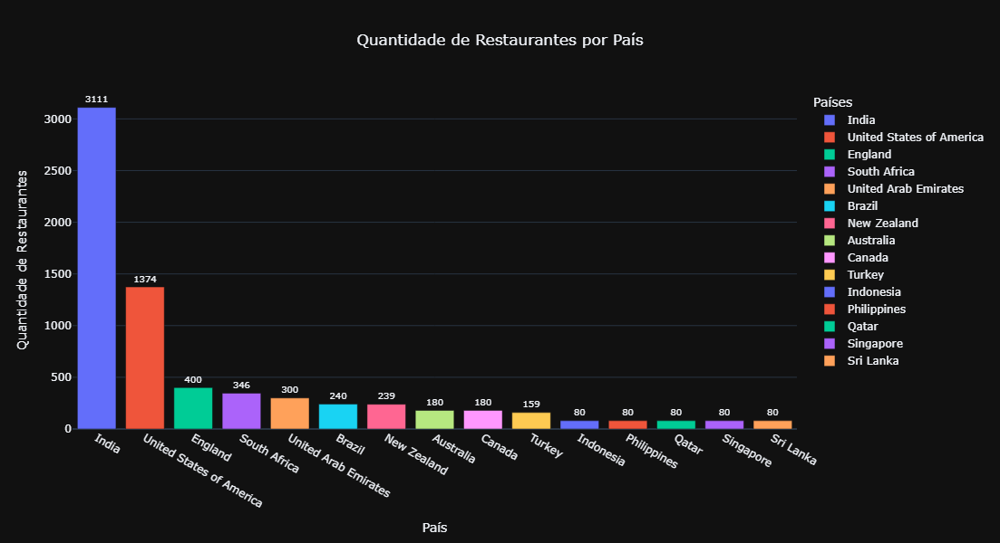

In [69]:
# Quantidade de restaurantes registrados por país
cols = ['restaurant_id', 'country_name']
qtd_rest_pais = df.loc[:, cols].groupby('country_name').nunique().sort_values('restaurant_id', ascending = False).reset_index()

# Gráfico
fig = px.bar(qtd_rest_pais, 
             x = 'country_name', 
             y = 'restaurant_id',
             color = 'country_name', 
             title = 'Quantidade de Restaurantes por País',
             text = 'restaurant_id') # adiciona o valor nas barras

# Renomeiar eixos e legenda
fig.update_layout(xaxis_title = 'País', # renomeia o eixo x
                  yaxis_title = 'Quantidade de Restaurantes', # renomeia o eixo y
                  legend_title_text = 'Países', # título da legenda
                  template = 'plotly_dark',  # Alterar o tema
                  font = dict(size = 12), # Alterar o tamanho da fonte
                  title_x = 0.5, # centraliza o título
                  height = 600,  # Define a altura do gráfico
                  width = 1300)   # Define a largura do gráfico

# Atualizar as anotações para exibir os valores nas barras
fig.update_traces(
    texttemplate = '%{text}', 
    textposition ='outside',  # Exibir o valor fora da barra
    textfont_size = 10  # Tamanho da fonte dos valores
)

# Plot Gráfico
fig.show()

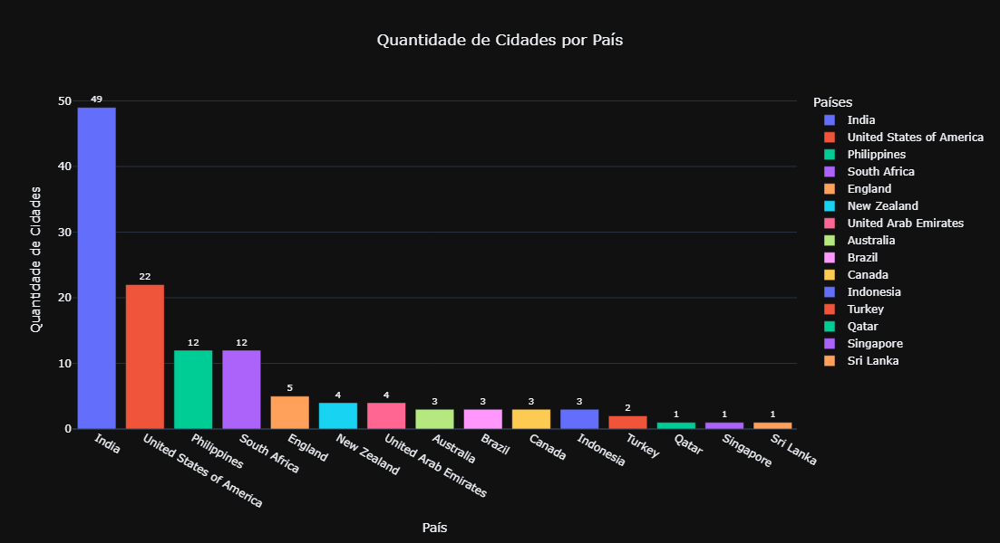

In [70]:
# Quantidade de cidades registrados por país
cols = ['city', 'country_name']
qtd_rest_pais = df.loc[:, cols].groupby('country_name').nunique().sort_values('city', ascending = False).reset_index()

# Gráfico
fig = px.bar(qtd_rest_pais, 
             x = 'country_name', 
             y = 'city',
             color = 'country_name', 
             title = 'Quantidade de Cidades por País',
             text = 'city') # adiciona o valor nas barras

# Renomeiar eixos e legenda
fig.update_layout(xaxis_title = 'País', # renomeia o eixo x
                  yaxis_title = 'Quantidade de Cidades', # renomeia o eixo y
                  legend_title_text = 'Países', # título da legenda
                  template = 'plotly_dark',  # Alterar o tema
                  font = dict(size = 12), # Alterar o tamanho da fonte
                  title_x = 0.5, # centraliza o título
                  height = 600,  # Define a altura do gráfico
                  width = 1300)   # Define a largura do gráfico

# Atualizar as anotações para exibir os valores nas barras
fig.update_traces(
    texttemplate = '%{text}', 
    textposition ='outside',  # Exibir o valor fora da barra
    textfont_size = 10  # Tamanho da fonte dos valores
)

# Plot Gráfico
fig.show()

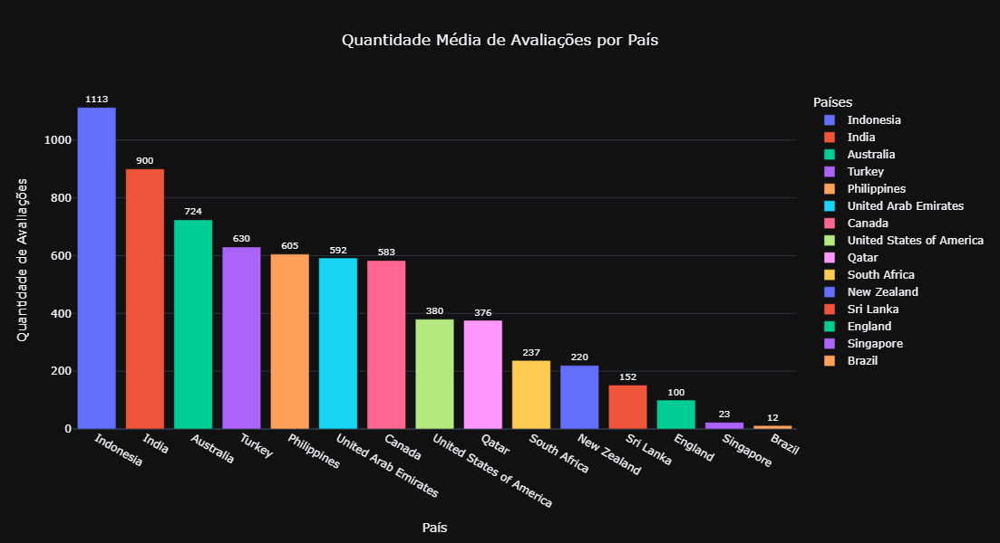

In [71]:
# Quantidade de avaliações por país
cols = ['votes', 'country_name']
qtd_avaliacoes_pais  = df.loc[:, cols].groupby('country_name').mean().sort_values('votes', ascending = False).reset_index()
qtd_avaliacoes_pais['votes'] = qtd_avaliacoes_pais['votes'].round(0)

# Gráfico
fig = px.bar(qtd_avaliacoes_pais , 
             x = 'country_name', 
             y = 'votes',
             color = 'country_name', 
             title = 'Quantidade Média de Avaliações por País',
             text = 'votes') # adiciona o valor nas barras)

# Renomeiar eixos e legenda
fig.update_layout(xaxis_title = 'País', # renomeia o eixo x
                  yaxis_title = 'Quantidade de Avaliações', # renomeia o eixo y
                  legend_title_text = 'Países', # título da legenda
                  template = 'plotly_dark',  # Alterar o tema
                  font = dict(size = 12), # Alterar o tamanho da fonte
                  title_x = 0.5, # centraliza o título
                  height = 600,  # Define a altura do gráfico
                  width = 1300)   # Define a largura do gráfico

# Atualizar as anotações para exibir os valores nas barras
fig.update_traces(
    texttemplate = '%{text}', 
    textposition ='outside',  # Exibir o valor fora da barra
    textfont_size = 10  # Tamanho da fonte dos valores
)

# Plot Gráfico
fig.show()

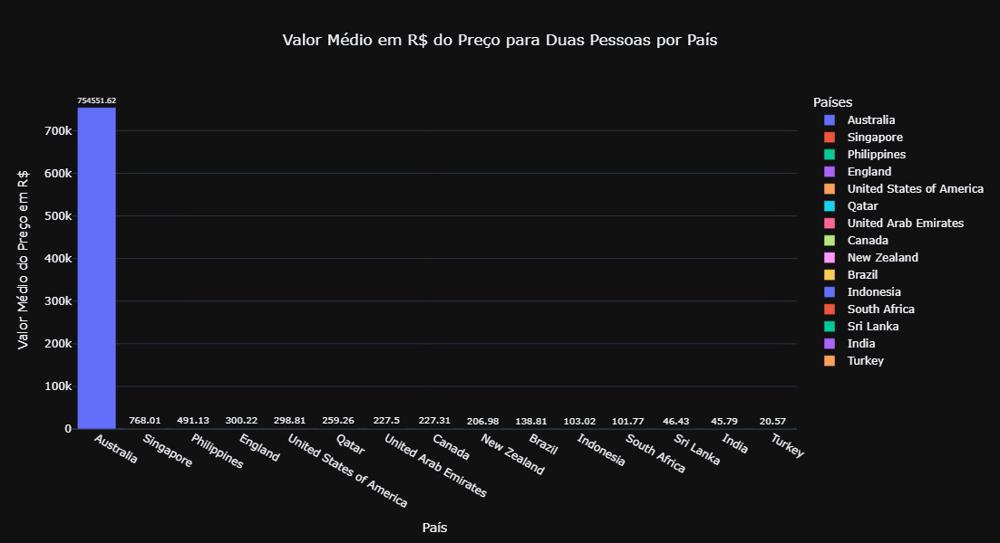

In [72]:
# Média de preço para duas pessoas por país
cols = ['average_cost_for_two_brl', 'country_name']
average_two = df.loc[:, cols].groupby('country_name').mean().sort_values('average_cost_for_two_brl', ascending = False).reset_index()
average_two['average_cost_for_two_brl'] = average_two['average_cost_for_two_brl'].round(2)

# Gráfico
fig = px.bar(average_two, 
             x = 'country_name', 
             y = 'average_cost_for_two_brl',
             color = 'country_name', 
             title = 'Valor Médio em R$ do Preço para Duas Pessoas por País',
             text = 'average_cost_for_two_brl') # adiciona o valor nas barras))

# Renomeiar eixos e legenda
fig.update_layout(xaxis_title = 'País', # renomeia o eixo x
                  yaxis_title = 'Valor Médio do Preço em R$', # renomeia o eixo y
                  legend_title_text = 'Países', # título da legenda
                  template = 'plotly_dark',  # Alterar o tema
                  font = dict(size = 12), # Alterar o tamanho da fonte
                  title_x = 0.5, # centraliza o título
                  height = 600,  # Define a altura do gráfico
                  width = 1300)   # Define a largura do gráfico

# Atualizar as anotações para exibir os valores nas barras
fig.update_traces(
    texttemplate = '%{text}', 
    textposition ='outside',  # Exibir o valor fora da barra
    textfont_size = 10  # Tamanho da fonte dos valores
)

# Plot Gráfico
fig.show()

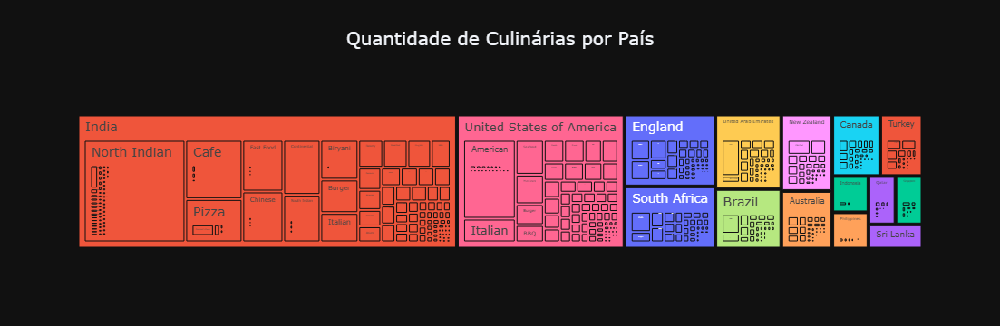

In [73]:
# Agrupar os dados
agg_df = df.groupby(['country_name', 'cuisines', 'restaurant_name']).size().reset_index(name='count')

# Criar o treemap
fig = px.treemap(agg_df, 
                 path=['country_name', 'cuisines', 'restaurant_name'], 
                 values='count',
                 title='Quantidade de Culinárias por País',
                 color='country_name')

# Atualizar layout do gráfico
fig.update_layout(
    title_x=0.5,  # Centralizar o título
    font=dict(size=14),  # Tamanho da fonte
    template='plotly_dark'  # Tema escuro
)

# Mostrar o gráfico
fig.show()

## Cities

In [74]:
# Quantidade de restaurantes da cidade de cada país com mais restaurantes cadastrados
cols = ['country_name', 'city', 'restaurant_id']
qtd_rest_cidade = df.loc[:, cols].groupby(['country_name', 'city']).nunique().reset_index()

# ordenando por país em alfabetica e quantidade em decrescente
qtd_rest_cidade = qtd_rest_cidade.sort_values(by=['country_name', 'restaurant_id'], ascending=[True, False])

# Seleciona a cidade com o maior número de restaurantes para cada país
cidade_mais_rest = qtd_rest_cidade.groupby('country_name').head(10).reset_index()

# Gráfico
fig = px.bar(cidade_mais_rest, 
             x = 'city', 
             y = 'restaurant_id',
             color = 'country_name', 
             title = 'Quantidade de Restaurantes nas 10 Cidades com mais Cadastros de Restaurantes no País',
             text = 'restaurant_id') # adiciona o valor nas barras

# Renomeiar eixos e legenda
fig.update_layout(xaxis_title = 'Cidadea', # renomeia o eixo x
                  yaxis_title = 'Quantidade de Restaurantes', # renomeia o eixo y
                  legend_title_text = 'Países', # título da legenda
                  template = 'plotly_dark',  # Alterar o tema
                  font = dict(size = 12), # Alterar o tamanho da fonte
                  title_x = 0.5, # centraliza o título
                  height = 600,  # Define a altura do gráfico
                  width = 1300)   # Define a largura do gráfico

# Atualizar as anotações para exibir os valores nas barras
fig.update_traces(
    texttemplate = '%{text}', 
    textposition ='outside',  # Exibir o valor fora da barra
    textfont_size = 10  # Tamanho da fonte dos valores
)

# Plot Gráfico
fig.show()

In [75]:
# Top 10 cidades com restaurantes com média de avaliação maior que 4
cols = ['country_name', 'city', 'aggregate_rating', 'restaurant_id']
lines = df['aggregate_rating'] >= 4.0 
qtd_4rating_cidade = df.loc[lines, cols].groupby(['country_name', 'city']).agg({'aggregate_rating': 'mean', 'restaurant_id': 'nunique'})
qtd_4rating_cidade.columns = ['aggregate_rating', 'restaurant_id']
qtd_4rating_cidade.reset_index(inplace = True)

# ordenando por país em alfabetica e quantidade em decrescente
qtd_4rating_cidade = qtd_4rating_cidade.sort_values(by=['country_name','restaurant_id'], ascending = [True, False])

# Seleciona a cidade com o maior número de restaurantes para cada país
cidade_4rating_rest = qtd_4rating_cidade.groupby('country_name').head(10)
cidade_4rating_rest.reset_index(inplace = True, drop = True)

# Gráfico
fig = px.bar(cidade_4rating_rest, 
             x = 'city', 
             y = 'restaurant_id',
             color = 'country_name', 
             title = 'Quantidade de Restaurantes com a Média de Avaliação maior que 4.0 nas 10 Cidades com mais Cadastros do País',
             text = 'restaurant_id') # adiciona o valor nas barras

# Renomeiar eixos e legenda
fig.update_layout(xaxis_title = 'Cidadea', # renomeia o eixo x
                  yaxis_title = 'Quantidade de Restaurantes', # renomeia o eixo y
                  legend_title_text = 'Países', # título da legenda
                  template = 'plotly_dark',  # Alterar o tema
                  font = dict(size = 12), # Alterar o tamanho da fonte
                  title_x = 0.5, # centraliza o título
                  height = 600,  # Define a altura do gráfico
                  width = 1300)   # Define a largura do gráfico

# Atualizar as anotações para exibir os valores nas barras
fig.update_traces(
    texttemplate = '%{text}', 
    textposition ='outside',  # Exibir o valor fora da barra
    textfont_size = 10  # Tamanho da fonte dos valores
)

# Plot Gráfico
fig.show()

In [76]:
# Top 10 cidades com restaurantes com média de avaliação menor que 3
cols = ['country_name', 'city', 'aggregate_rating', 'restaurant_id']
lines = df['aggregate_rating'] <= 3.0 
qtd_3rating_cidade = df.loc[lines, cols].groupby(['country_name', 'city']).agg({'aggregate_rating': 'mean', 'restaurant_id': 'nunique'})
qtd_3rating_cidade.columns = ['aggregate_rating', 'restaurant_id']
qtd_3rating_cidade.reset_index(inplace = True)

# ordenando por país em alfabetica e quantidade em decrescente
qtd_3rating_cidade = qtd_3rating_cidade.sort_values(by=['country_name', 'restaurant_id'], ascending = [True, False])

# Seleciona a cidade com o maior número de restaurantes para cada país
cidade_3rating_rest = qtd_3rating_cidade.groupby('country_name').head(10)
cidade_3rating_rest.reset_index(inplace = True, drop = True)

# Gráfico
fig = px.bar(cidade_3rating_rest, 
             x = 'city', 
             y = 'restaurant_id',
             color = 'country_name', 
             title = 'Quantidade de Restaurantes com a Média de Avaliação menor que 3.0 nas 10 Cidades com mais Cadastros do País',
             text = 'restaurant_id') # adiciona o valor nas barras

# Renomeiar eixos e legenda
fig.update_layout(xaxis_title = 'Cidadea', # renomeia o eixo x
                  yaxis_title = 'Quantidade de Restaurantes', # renomeia o eixo y
                  legend_title_text = 'Países', # título da legenda
                  template = 'plotly_dark',  # Alterar o tema
                  font = dict(size = 12), # Alterar o tamanho da fonte
                  title_x = 0.5, # centraliza o título
                  height = 600,  # Define a altura do gráfico
                  width = 1300)   # Define a largura do gráfico

# Atualizar as anotações para exibir os valores nas barras
fig.update_traces(
    texttemplate = '%{text}', 
    textposition ='outside',  # Exibir o valor fora da barra
    textfont_size = 10  # Tamanho da fonte dos valores
)

# Plot Gráfico
fig.show()

In [77]:
# Top 10 cidades com culinárias distintas
cols = ['country_name', 'city', 'cuisines']
qtd_cuisine_cidade = df.loc[:, cols].groupby(['country_name', 'city']).nunique().reset_index()

# ordenando por país em alfabetica e quantidade em decrescente
qtd_cuisine_cidade = qtd_cuisine_cidade.sort_values(by = ['country_name', 'cuisines'], ascending = [True, False])

# Seleciona a cidade com o maior número de restaurantes para cada país
cidade_cuisine_rest = qtd_cuisine_cidade.groupby('country_name').head(10)
cidade_cuisine_rest.reset_index(inplace = True, drop = True)

# Gráfico
fig = px.bar(cidade_cuisine_rest, 
             x = 'city', 
             y = 'cuisines',
             color = 'country_name', 
             title = 'Quantidade de Restaurantes com Culinária Distinta nas 10 Cidades com mais Cadastros do País',
             text = 'cuisines') # adiciona o valor nas barras

# Renomeiar eixos e legenda
fig.update_layout(xaxis_title = 'Cidades', # renomeia o eixo x
                  yaxis_title = 'Quantidade de Restaurantes', # renomeia o eixo y
                  legend_title_text = 'Países', # título da legenda
                  template = 'plotly_dark',  # Alterar o tema
                  font = dict(size = 12), # Alterar o tamanho da fonte
                  title_x = 0.5, # centraliza o título
                  height = 600,  # Define a altura do gráfico
                  width = 1300)   # Define a largura do gráfico

# Atualizar as anotações para exibir os valores nas barras
fig.update_traces(
    texttemplate = '%{text}', 
    textposition ='outside',  # Exibir o valor fora da barra
    textfont_size = 10  # Tamanho da fonte dos valores
)

# Plot Gráfico
fig.show()

## Cuisines

In [78]:
# Top 5 cuilinária e restaurantes
#cols = ['cuisines', 'restaurant_name', 'aggregate_rating']
#top_cuisines_rest = df.loc[:, cols].groupby(['cuisines', 'restaurant_name']).mean().sort_values(by = ['aggregate_rating'], ascending = False).reset_index()
#best_restaurant_per_cuisine = top_cuisines_rest.groupby('cuisines').first().sort_values(by = ['aggregate_rating'], ascending = False).reset_index()
#best_restaurant_per_cuisine_top5 = best_restaurant_per_cuisine.head(5)
#best_restaurant_per_cuisine_top5

In [79]:
# Selecionar o melhor restaurante em cada país com base na nota
best_restaurants = df.sort_values(by='aggregate_rating', ascending=False).groupby('country_name').first().reset_index()

# Exibir informações desejadas: nome do restaurante, país, tipo de culinária e a nota
cols_to_show = ['country_name', 'restaurant_name', 'cuisines', 'aggregate_rating']
top_restaurants_info = best_restaurants[cols_to_show]

top_restaurants_info

,country_name,restaurant_name,cuisines,aggregate_rating
0,Australia,Mandoo Korean Dumplings,Korean,4.9
1,Brazil,Churrascaria Palace,Steak,4.9
2,Canada,Jimmy's A&A Mediterranean Deli,Mediterranean,4.9
3,England,Chin Chin Labs,Ice Cream,4.9
4,India,Pabbas,Ice Cream,4.9
5,Indonesia,Sushi Masa,Sushi,4.9
6,New Zealand,Duck Island Ice Cream,Ice Cream,4.9
7,Philippines,Silantro Fil-Mex,Filipino,4.9
8,Qatar,The Cheesecake Factory,American,4.9
9,Singapore,Ronin Cafe,Cafe,4.9


In [80]:
# melhor restaurante para cada tipo culinário
best_restaurants_cuisine = df.sort_values(by='aggregate_rating', ascending=False).groupby('cuisines').first().reset_index()

# Exibir informações desejadas: nome do restaurante, país, tipo de culinária e a nota
cols_to_show = ['cuisines', 'restaurant_name', 'country_name', 'aggregate_rating']
top_restaurants_info = best_restaurants_cuisine[cols_to_show]

top_restaurants_info

,cuisines,restaurant_name,country_name,aggregate_rating
0,Afghan,Khan Baba,India,4.1
1,African,Kream,South Africa,4.8
2,American,"Tocabe, An American Indian Eatery",United States of America,4.9
3,Andhra,Gourmet Nine,India,4.7
4,Arabian,Mandi@36,India,4.7
...,...,...,...,...
160,Vegetarian,Lola Rosa Cafe,Canada,4.7
161,Vietnamese,Vietnam House Restaurant & Gallery,England,4.9
162,Western,The Garden,Indonesia,4.6
163,World Cuisine,Gaga Manjero,Turkey,4.9


In [81]:
# Top 10 cuilinárias
cols = ['cuisines', 'aggregate_rating']
top_cuisines = df.loc[:, cols].groupby(['cuisines']).mean().sort_values(by = ['aggregate_rating'], ascending = False).reset_index()
top10_cuisines = top_cuisines.head(10)

# Gráfico
fig = px.bar(top10_cuisines, 
             x = 'cuisines', 
             y = 'aggregate_rating',
             color = 'cuisines', 
             title = '10 Culinárias com as Melhores Avaliações',
             text = 'aggregate_rating') # adiciona o valor nas barras

# Renomeiar eixos e legenda
fig.update_layout(xaxis_title = 'Culinárias', # renomeia o eixo x
                  yaxis_title = 'Notas', # renomeia o eixo y
                  legend_title_text = 'Culinárias', # título da legenda
                  template = 'plotly_dark',  # Alterar o tema
                  font = dict(size = 12), # Alterar o tamanho da fonte
                  title_x = 0.5, # centraliza o título
                  height = 600,  # Define a altura do gráfico
                  width = 1300)   # Define a largura do gráfico

# Atualizar as anotações para exibir os valores nas barras
fig.update_traces(
    texttemplate = '%{text:.1f}', 
    textposition ='outside',  # Exibir o valor fora da barra
    textfont_size = 10  # Tamanho da fonte dos valores
)

# Plot Gráfico
fig.show()

In [82]:
# Piores 10 cuilinárias
cols = ['cuisines', 'aggregate_rating']
worst_cuisines = df.loc[:, cols].groupby(['cuisines']).mean().sort_values(by = ['aggregate_rating'], ascending = True).reset_index()
worst10_cuisines = worst_cuisines.head(10)

# Gráfico
fig = px.bar(worst10_cuisines, 
             x = 'cuisines', 
             y = 'aggregate_rating',
             color = 'cuisines', 
             title = '10 Culinárias com as Piores Avaliações',
             text = 'aggregate_rating') # adiciona o valor nas barras

# Renomeiar eixos e legenda
fig.update_layout(xaxis_title = 'Culinárias', # renomeia o eixo x
                  yaxis_title = 'Notas', # renomeia o eixo y
                  legend_title_text = 'Culinárias', # título da legenda
                  template = 'plotly_dark',  # Alterar o tema
                  font = dict(size = 12), # Alterar o tamanho da fonte
                  title_x = 0.5, # centraliza o título
                  height = 600,  # Define a altura do gráfico
                  width = 1300)   # Define a largura do gráfico

# Atualizar as anotações para exibir os valores nas barras
fig.update_traces(
    texttemplate = '%{text:.1f}', 
    textposition ='outside',  # Exibir o valor fora da barra
    textfont_size = 10  # Tamanho da fonte dos valores
)

# Plot Gráfico
fig.show()